In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../')
sys.path.append('../hovernet')
sys.path.append('../hedest')

import json
import os
import pickle
import torch
import scanpy as sc
import pandas as pd
import seaborn as sns
sns.set_context("talk")
sns.set_style("whitegrid")

PATH = '/home/luca/Documents/data/'

# Load data

In [2]:
#load adata
adata_name = 'Visium_FFPE_Human_Breast_Cancer'
data_path = os.path.join(PATH, adata_name)
path_ST_adata = os.path.join(data_path, "ST")
adata = sc.read_visium(path_ST_adata)

#load segmentation
json_path = os.path.join(data_path, "seg_json/pannuke_fast_mask_lvl3.json")
with open(json_path) as json_file:
    hovernet_dict = json.load(json_file)

#load spot proportions
spot_prop_df = pd.read_csv(os.path.join(data_path, f'props/DestVI_4000_hvg_squash_06_02_Visium_FFPE_Human_Breast_Cancer_prop.csv'), index_col=0)
spot_prop_df.index = spot_prop_df.index.astype(str)
ct_list = spot_prop_df.columns.tolist()

/home/luca/anaconda3/envs/plugin-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/luca/anaconda3/envs/plugin-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [3]:
#load images
image_path = os.path.join(data_path, "pyr_tif/Visium_FFPE_Human_Breast_Cancer_image.tif")
image_dict = torch.load(os.path.join(data_path, "image_dict_64.pt"))

In [4]:
#load model infos
model_dir = '../models/Breast_cancer_FFPE/DestVI_4000_hvg_squash_06_02/model_quick_alpha_0.0_lr_0.0003_divergence_l2_beta_0.0_seed_42/'
# model_dir = '../models/Breast_cancer_FFPE/DestVI_2000_hvg_squash_05_02_no_endo/model_quick_alpha_0.0_lr_0.0003_divergence_l2_beta_0.0_seed_43/'

with open(os.path.join(model_dir, 'info.pickle'), 'rb') as f:
    model_info = pickle.load(f)

In [5]:
from hedest.analysis.pred_analyzer import PredAnalyzer

analyzer = PredAnalyzer(model_info=model_info)

Loading predicted labels...
Use `add_attributes(seg_dict=your_seg_dict)` to add one.


In [6]:
analyzer.add_attributes(image_dict=image_dict,
                        adata=adata,
                        adata_name=adata_name,
                        image_path=image_path,
                        seg_dict=hovernet_dict)

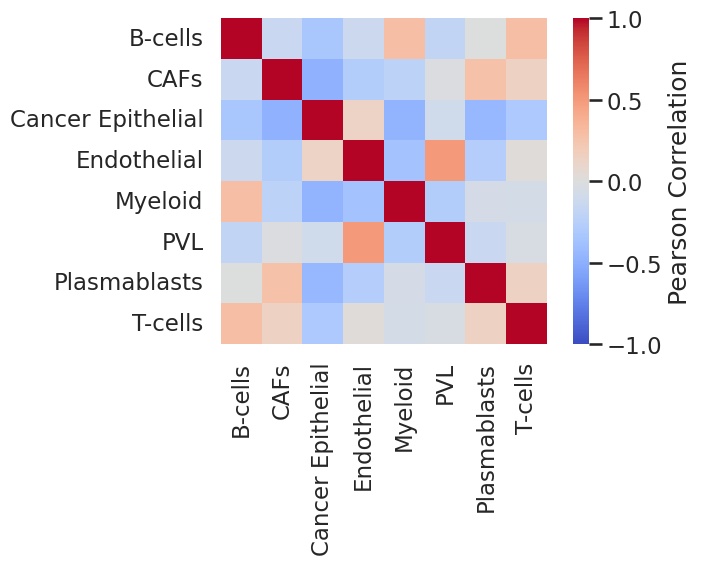

In [7]:
analyzer.plot_colocalization_matrix(display=False)
# fig.savefig(f'figures/coloc_matrix.png', dpi=300, bbox_inches='tight')

In [8]:
from hedest.analysis.postseg import StdVisualizer

color_dict = {
    '0': ['B-cells', [200, 255, 200, 255]],
    '1': ['CAFs', [255, 140, 0, 255]],
    '2': ['Cancer Epithelial', [31, 119, 180, 255]],
    '3': ['Endothelial', [230, 90, 60, 255]],
    '4': ['Myeloid', [0, 170, 140, 255]],
    '5': ['PVL', [255, 220, 100, 255]],
    '6': ['Plasmablasts', [128, 0, 128, 255]],
    '7': ['T-cells', [0, 150, 0, 255]]
}

analyzer.color_dict = color_dict
plotter = StdVisualizer(image_path, 
                        adata, 
                        adata_name, 
                        seg_dict=analyzer.seg_dict_w_class,
                        color_dict=color_dict)

Visium data found.


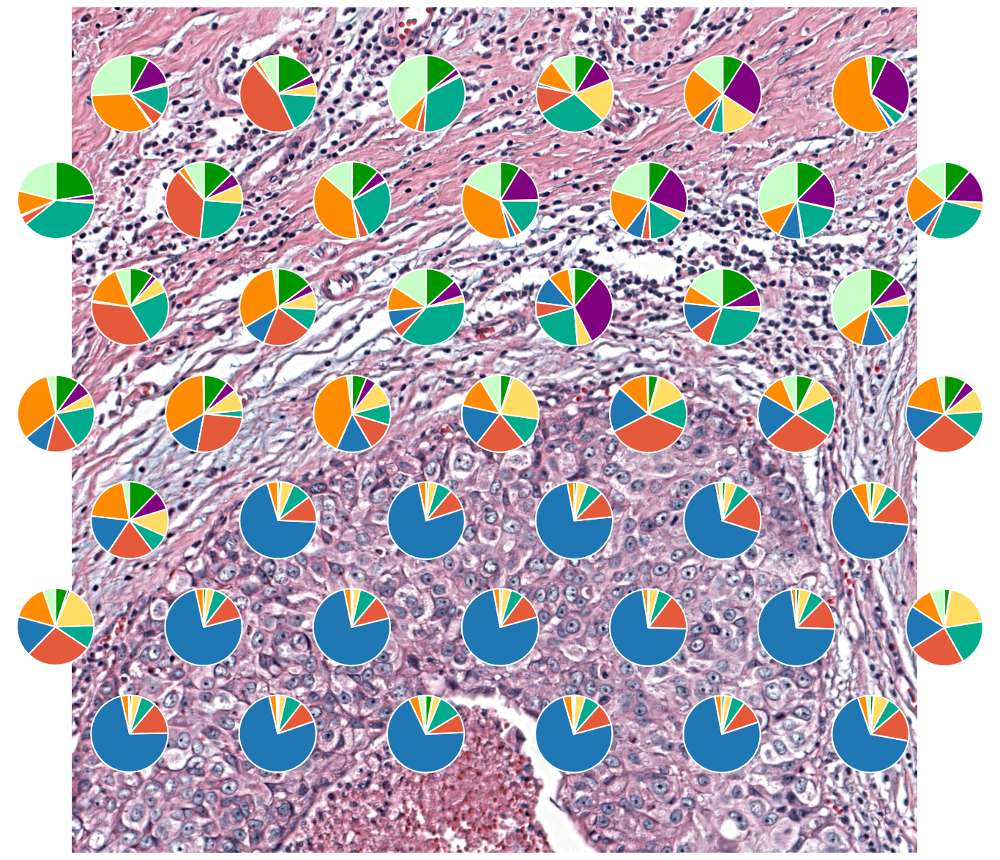

In [9]:
window = ((9500, 10500), (2000, 2000))
plotter.plot_slide(window, title="", spot_prop_df=spot_prop_df, show_visium=True)

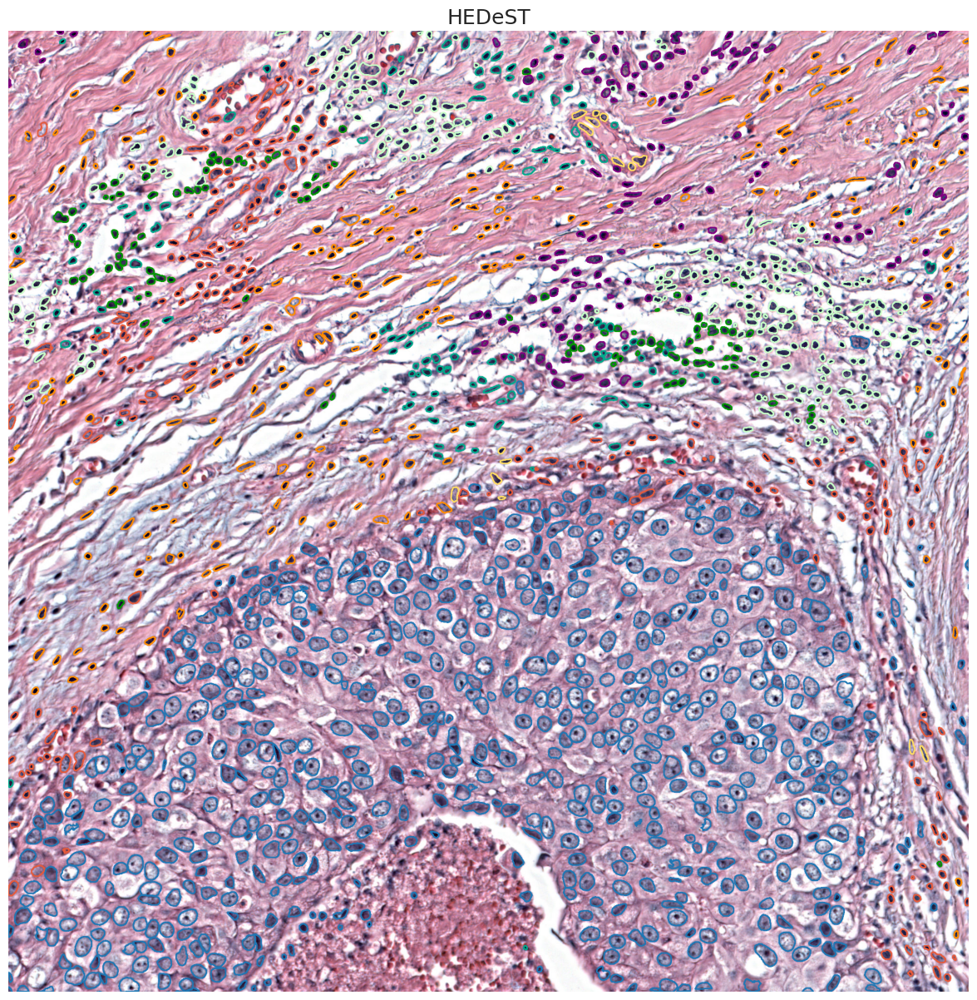

In [10]:
window = ((9500, 10500), (2000, 2000))
plotter.plot_seg(window, title="HEDeST", show_visium=False)

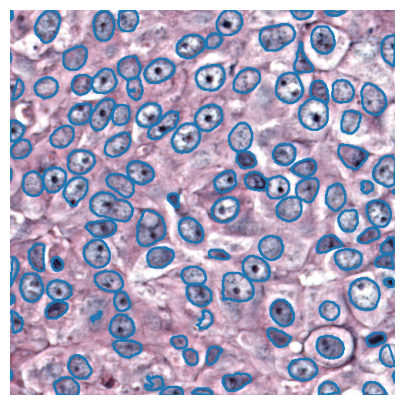

In [11]:
window = ((10700, 11750), (500, 500))
plotter.plot_seg(window, title="", show_visium=False, figsize=(5,5))

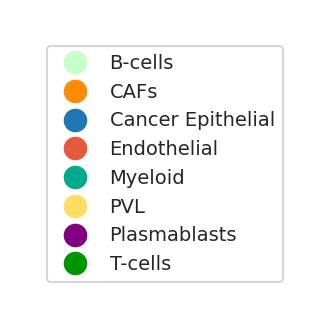

In [12]:
from hedest.analysis.plots import plot_legend

plot_legend(color_dict)

In [ ]:
analyzer.plot_grid_celltype(n=90, selection="max", show_probs = False, display=False, nrows=2, ncols=4, fontsize=30)
# fig.savefig(f'figures/grid_celltype.png', dpi=300, bbox_inches='tight')

In [31]:
window = ((4900, 3400), (18800, 19900))
fig = plotter.plot_seg_overlays(window, separated=True, scale_cells=4, display=False)
fig.savefig(f'figures/full_seg_overlay.svg', format='svg', dpi=600, bbox_inches='tight')

B-cells > T-cells: U=586764.000, p=9.6206e-09 (***)
Plasmablasts > B-cells: U=1805375.000, p=4.6256e-06 (***)


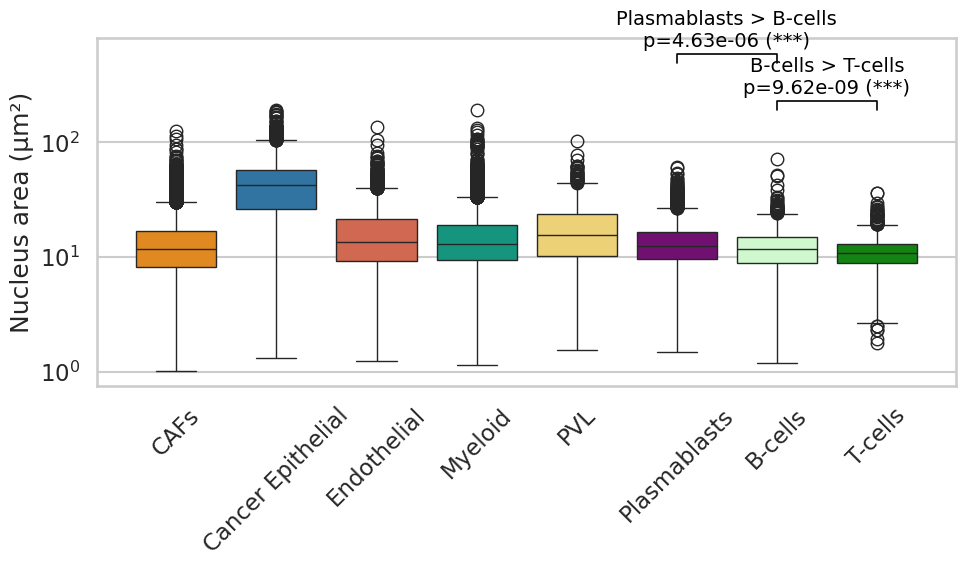

In [23]:
new_ct_list = ['CAFs', 'Cancer Epithelial', 'Endothelial', 'Myeloid', 'PVL', 'Plasmablasts', 'B-cells', 'T-cells']
analyzer.compare_area(cell_types=new_ct_list, 
                      ct_utest=[['B-cells', 'T-cells'], ['Plasmablasts', 'B-cells']],
                      height_unit_factor=0.18,
                      y_offset_factor=1.2,
                      fontsize_utest=14,
                      # savefig='figures/area_comparison.svg'
                      )

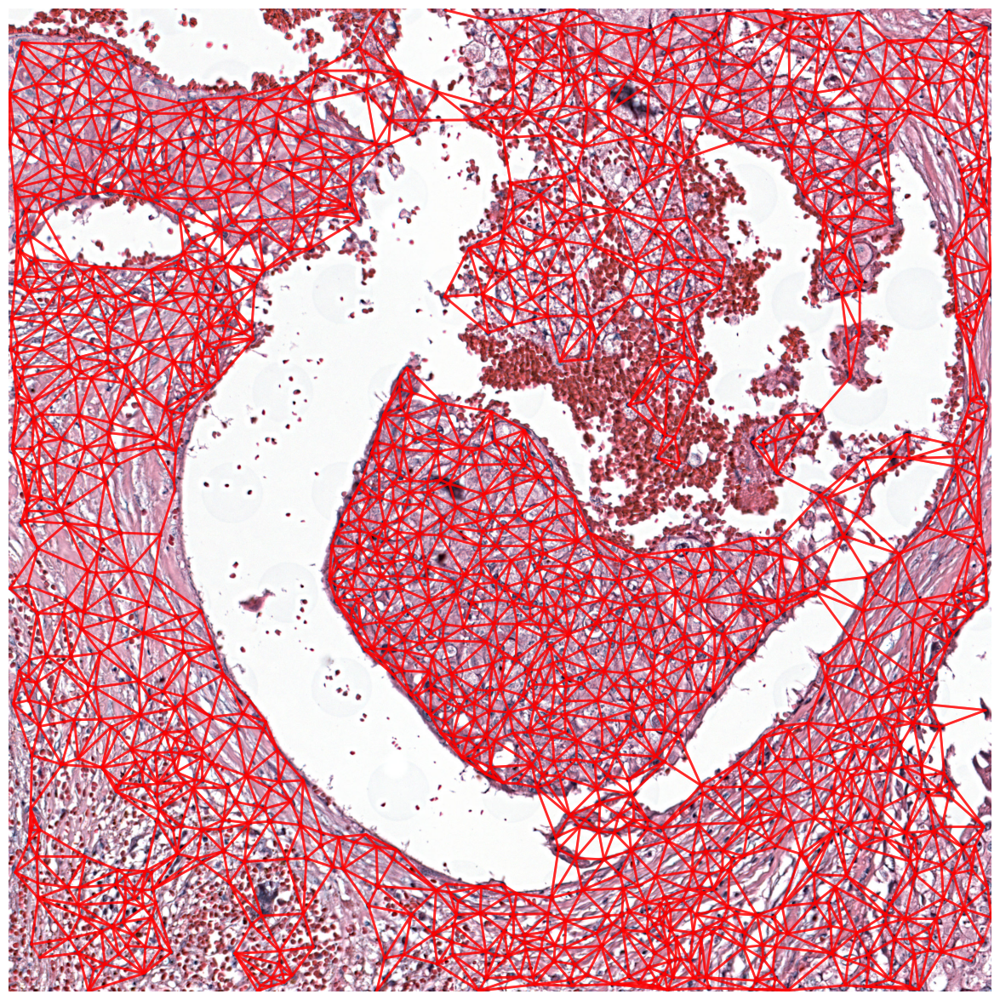

In [24]:
plotter.plot_delaunay_graph(window=((18500, 12000), (2500, 2500)),
                            max_distance=150,
                            linewidth=2,
                            display = False
                            )
# fig.savefig(f'figures/delaunay_graph.png', dpi=300, bbox_inches='tight')

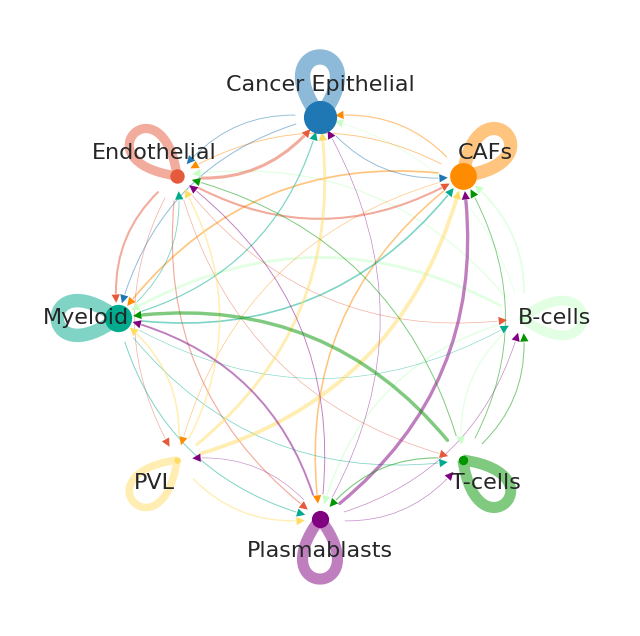

In [77]:
analyzer.compute_neighborhood_composition(max_distance=None)
analyzer.plot_colocalization_graph(display=False, fontsize=16)
# fig.savefig(f'figures/coloc_graph.png', dpi=300, bbox_inches='tight')

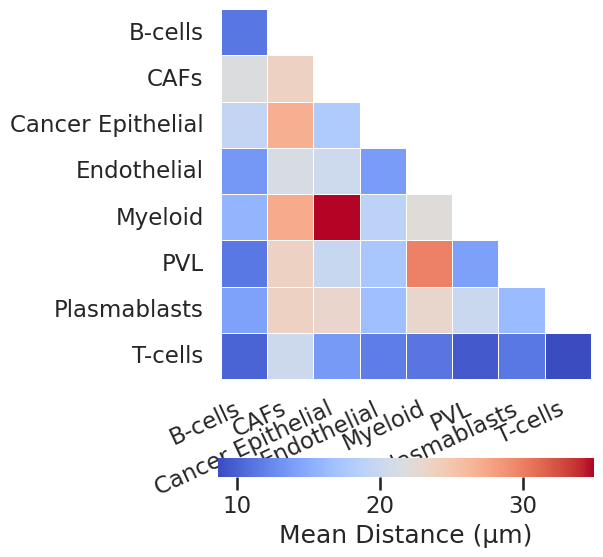

In [27]:
analyzer.plot_mean_neighbor_distances(display=False)
# fig.savefig(f'figures/mean_neighbor_distances.svg', format='svg', dpi=600, bbox_inches='tight')

In [32]:
import copy

nuc_dict = copy.deepcopy(analyzer.seg_dict_w_class["nuc"])
orig_types = {cid: cell_info.get("type", None) for cid, cell_info in analyzer.seg_dict_w_class["nuc"].items()}
neighbors = analyzer._build_delaunay_graph(max_distance=150)
threshold = 0.6

#tumor complex
for cell_id, cell_info in nuc_dict.items():
    cell_type = orig_types.get(cell_id)

    if cell_type != 2:
        cell_info["type"] = 0
        continue

    neigh_ids = neighbors.get(cell_id, [])
    if not neigh_ids:
        cell_info["type"] = 0
        continue

    cancer_neighbors = sum(
        1 for nid in neigh_ids
        if orig_types.get(nid) == 2
    )
    frac_cancer = cancer_neighbors / len(neigh_ids)

    cell_info["type"] = 1 if frac_cancer >= threshold else 0

In [33]:
#cells surrounding tumor
seen_neighbors = set()
neighbor_depth = 3
if not isinstance(neighbor_depth, int):
    raise ValueError("neighbor_depth must be an integer.")
if neighbor_depth <= 0 or neighbor_depth > 10:
    raise ValueError("neighbor_depth must be between 1 and 10.")

current_front = {cid for cid, cinfo in nuc_dict.items() if cinfo["type"] == 1}

for depth in range(neighbor_depth):
    next_front = set()
    for cell_id in current_front:
        neigh_ids = neighbors.get(cell_id, [])
        for nid in neigh_ids:
            if nid in seen_neighbors:
                continue
            seen_neighbors.add(nid)

            if orig_types.get(nid) == 2:
                continue

            if nuc_dict.get(nid, None) is not None:
                nuc_dict[nid]["type"] = 2
                next_front.add(nid)

    current_front = next_front

In [60]:
color_dict_tme = {
    '0': ['Other', [200, 200, 200, 255]],
    '1': ['Tumor complex', [31, 119, 180, 255]],
    '2': ['Surrounding cells', [255, 140, 0, 255]],
}

plotter_tme = StdVisualizer(image_path, 
                        adata, 
                        adata_name, 
                        seg_dict={'nuc': nuc_dict},
                        color_dict=color_dict_tme)

Visium data found.


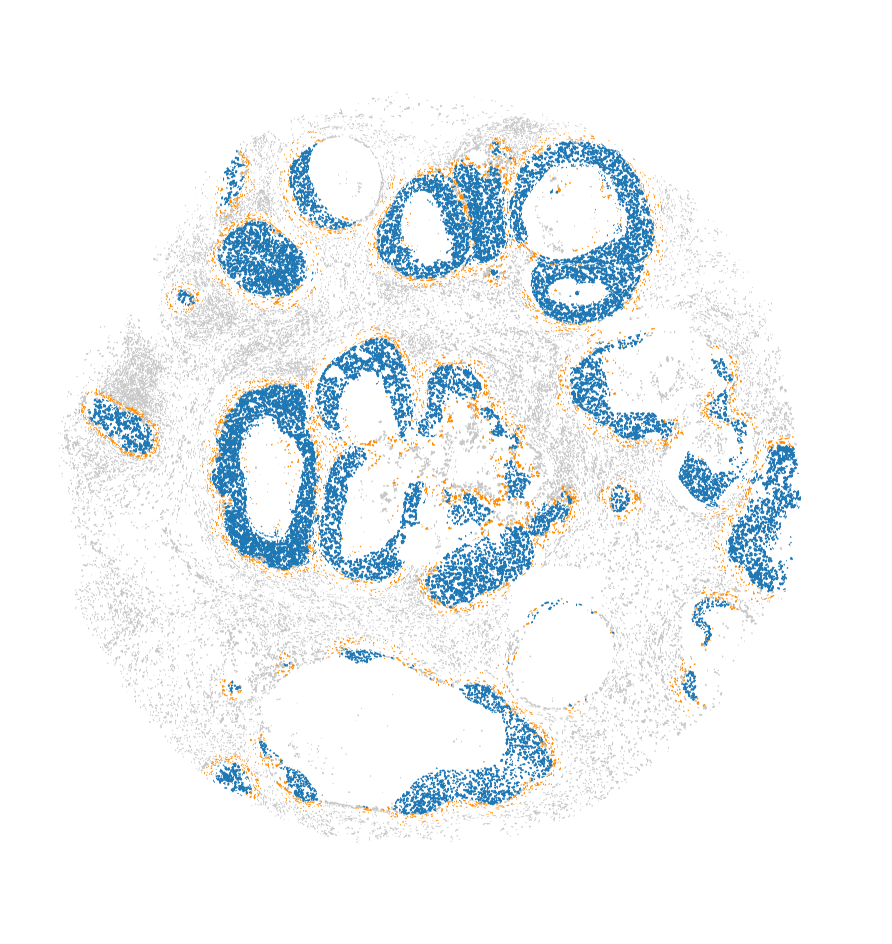

In [32]:
window = ((4900, 3400), (18800, 19900))
plotter_tme.plot_seg_overlays(window, separated=False, scale_cells=2, display = True)

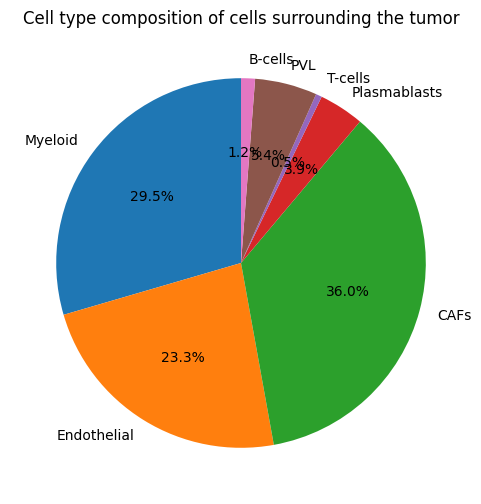

In [23]:
import matplotlib.pyplot as plt
from collections import Counter

border_types = [
    ct_list[orig_types[cid]] 
    for cid, cell_info in nuc_dict.items() 
    if cell_info["type"] == 2
]

counts = Counter(border_types)

fig, ax = plt.subplots(figsize=(6, 6))
ax.pie(
    counts.values(),
    labels=counts.keys(),
    autopct='%1.1f%%',
    startangle=90
)
ax.set_title("Cell type composition of cells surrounding the tumor")
plt.show()

In [34]:
import copy
import pandas as pd
import numpy as np
from collections import Counter

nuc_dict = copy.deepcopy(analyzer.seg_dict_w_class)

unique_types = sorted(set(orig_types.values()))
type_to_idx = {t: i for i, t in enumerate(unique_types)}

# --- Build neighbor proportion vectors ---
rows = []
cell_ids = []

for cell_id in neighbors.keys():
    neigh_ids = neighbors.get(cell_id, [])
    neigh_types = [orig_types.get(nid) for nid in neigh_ids if nid in orig_types]

    if not neigh_types:
        continue

    counts = Counter(neigh_types)
    total = sum(counts.values())

    vec = np.zeros(len(unique_types))
    for t, c in counts.items():
        vec[type_to_idx[t]] = c / total

    rows.append(vec)
    cell_ids.append(cell_id)

df_props = pd.DataFrame(rows, index=cell_ids, columns=unique_types)

# --- Clustering ---

# HDBSCAN
# import hdbscan
# clusterer = hdbscan.HDBSCAN(min_cluster_size=400, metric='euclidean')
# cluster_labels = clusterer.fit_predict(df_props.values)
# n_clusters = len(set(cluster_labels)) - 1

# Gaussian mixture
from sklearn.mixture import GaussianMixture
lowest_bic = np.infty
best_gmm = None
n_components_range = range(2, 9)

for n_components in n_components_range:
    gmm = GaussianMixture(n_components=n_components, covariance_type='full', random_state=42)
    gmm.fit(df_props.values)
    bic = gmm.bic(df_props.values)
    if bic < lowest_bic:
        lowest_bic = bic
        best_gmm = gmm

cluster_labels = best_gmm.predict(df_props.values)
n_clusters = best_gmm.n_components

In [35]:
# --- Switch some cluster labels ---
new_labels = cluster_labels.copy()

## 47 Clusters
# # Switch 32 <-> 6
# mask32 = cluster_labels == 32
# mask6 = cluster_labels == 6
# new_labels[mask32] = 6
# new_labels[mask6] = 32

# # Switch 36 <-> 5
# mask36 = cluster_labels == 36
# mask5 = cluster_labels == 5
# new_labels[mask36] = 5
# new_labels[mask5] = 36

## 15 Clusters
# Switch 12 <-> 5
# mask12 = cluster_labels == 12
# mask5 = cluster_labels == 5
# new_labels[mask12] = 5
# new_labels[mask5] = 12

# Switch 5 <-> 4
mask5 = cluster_labels == 5
mask4 = cluster_labels == 4
new_labels[mask5] = 4
new_labels[mask4] = 5

cluster_labels = new_labels


In [36]:

# --- Compute centroids ---
cluster_series = pd.Series(cluster_labels, index=df_props.index, name="cluster")
df_with_clusters = df_props.join(cluster_series)
df_with_clusters = df_with_clusters[df_with_clusters["cluster"] != -1]
centroids = df_with_clusters.groupby("cluster").mean()

In [39]:
from itertools import chain

# --- Replace types with clusters ---
for cid, clabel in zip(df_props.index, cluster_labels):
    nuc_dict["nuc"][cid]["type"] = str(clabel)

for cid in nuc_dict["nuc"]:
    if cid not in df_props.index:
        nuc_dict["nuc"][cid]["type"] = str(-1)

# --- Color dictionary ---
cmap_list = [plt.get_cmap(name) for name in ["Dark2", "tab20b", "tab20c"]]
colors = list(chain.from_iterable([cmap.colors for cmap in cmap_list]))
n_colors = len(colors)
palette = [
    tuple(int(c * 255) for c in colors[i % n_colors][:3]) + (255,)
    for i in range(n_clusters)
]
color_dict_neighbors = {str(i): [str(i), color] for i, color in enumerate(palette)}
color_dict_neighbors[str(-1)] = ["no_cluster", (200, 200, 200, 255)]

Visium data found.


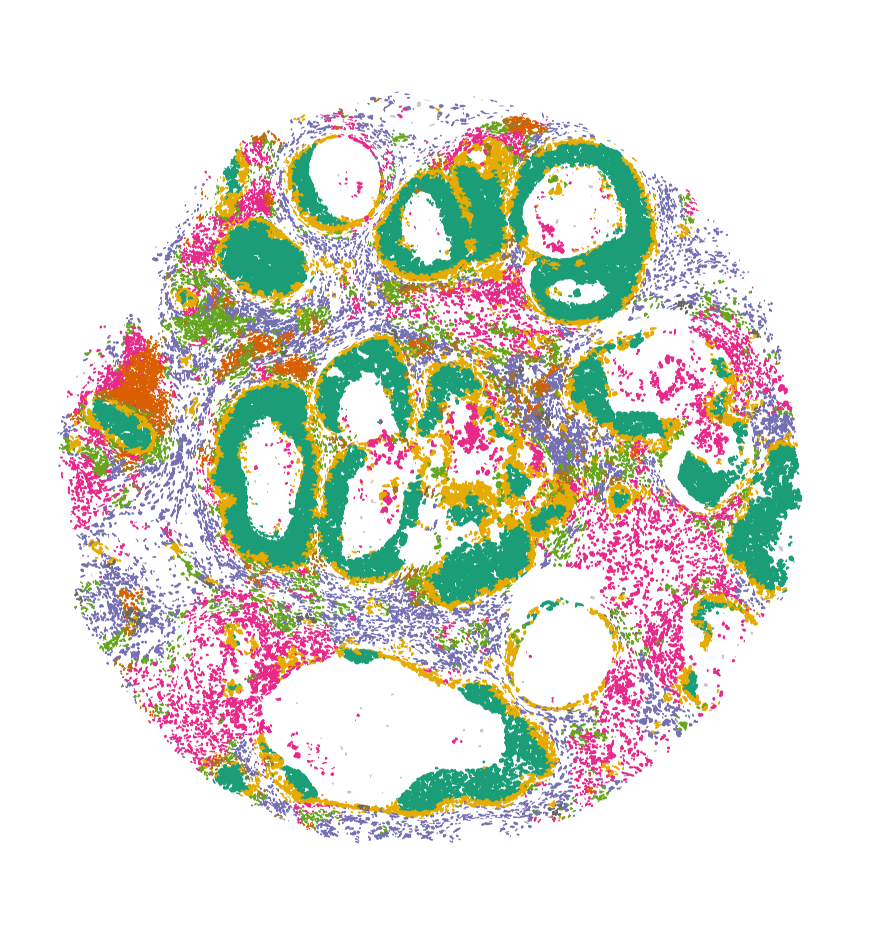

In [42]:
plotter_neighbors = StdVisualizer(image_path, 
                        adata, 
                        adata_name, 
                        seg_dict=nuc_dict,
                        color_dict=color_dict_neighbors)

window = ((4900, 3400), (18800, 19900))
plotter_neighbors.plot_seg_overlays(window, separated=False, scale_cells=4, display = False)
# fig.savefig(f'figures/neighborhood_clusters.png', dpi=600, bbox_inches='tight')

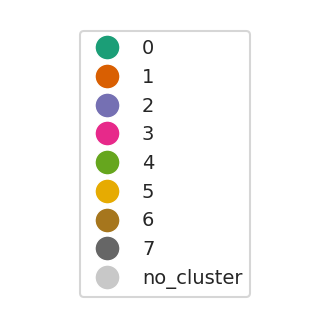

In [43]:
plot_legend(color_dict_neighbors, savefig='figures/neighborhood_legend.png')

([<matplotlib.patches.Wedge at 0x7255b4cf2460>,
 [Text(0.031083354119741044, 1.0995607418858984, ''),
  Text(0.63291314044003, 0.8996782517424432, ''),
  Text(1.0513649944009853, 0.3234681569308117, ''),
  Text(1.0914596326588422, 0.13680595848217122, ''),
  Text(1.0933708633628658, -0.12058256569314557, ''),
  Text(0.402726070378867, -1.0236267445886689, ''),
  Text(-1.0720375465721361, 0.2464457318348105, ''),
  Text(-0.0527280614534619, 1.0987355239252803, '')])

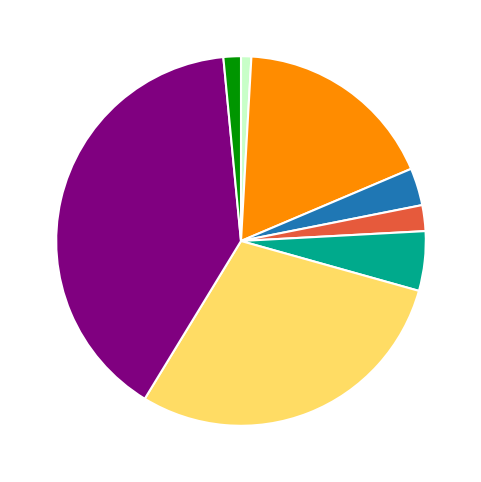

In [57]:
cluster_id = 7

prop_centroid = centroids.loc[cluster_id]
prop_centroid = prop_centroid[prop_centroid > 0]
labels = [ct_list[i] for i in prop_centroid.index]

# Convert RGBA values to Matplotlib-friendly normalized RGB
colors = []
for idx in prop_centroid.index:
    rgba = color_dict[str(idx)][1]  # get RGBA from color_dict
    rgb_norm = [c/255 for c in rgba[:3]]  # ignore alpha for pie chart
    colors.append(rgb_norm)

plt.figure(figsize=(6, 6))
plt.pie(
    prop_centroid,
    colors=colors,    
    startangle=90,
    counterclock=False
)
# plt.savefig(f"figures/cluster_{cluster_id}_centroid.png", dpi=300, bbox_inches='tight')

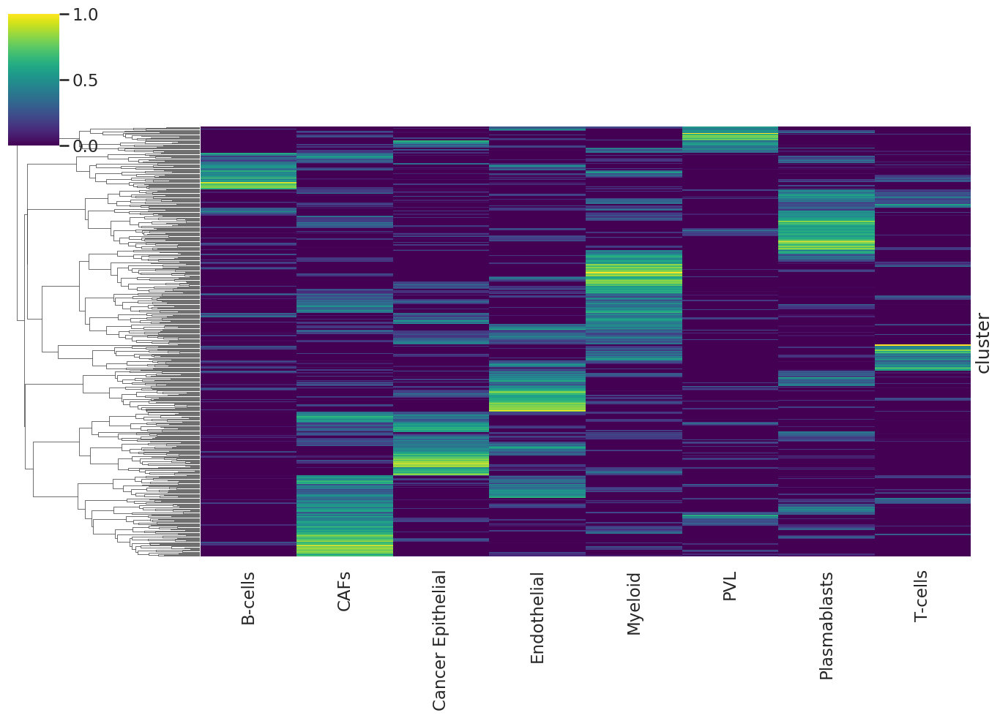

In [59]:
import pandas as pd
import numpy as np
from sklearn.mixture import GaussianMixture
import seaborn as sns
import matplotlib.pyplot as plt

rename_dict = {int(k): v[0] for k, v in color_dict.items()}
df_props = df_props.rename(columns=rename_dict)

# --- Step 1: Gaussian Mixture clustering ---
n_clusters = 500
gmm = GaussianMixture(n_components=n_clusters, covariance_type='full', random_state=42)
cluster_labels = gmm.fit_predict(df_props.values)

# --- Step 2: attach cluster labels ---
cluster_series = pd.Series(cluster_labels, index=df_props.index, name="cluster")
df_with_clusters = df_props.join(cluster_series)

# --- Step 3: compute centroids (mean composition per cluster) ---
centroids = df_with_clusters.groupby("cluster").mean()

# --- Step 4: hierarchical clustering heatmap ---
sns.clustermap(
    centroids,
    method='average',
    metric='euclidean',
    cmap='viridis',
    figsize=(14, 10),
    xticklabels=True,   # show cell type names
    yticklabels=False,    # show cluster IDs
    col_cluster=False,
)
# plt.savefig('figures/neighborhood_clusters_heatmap.svg', format='svg', dpi=600, bbox_inches='tight')
plt.show()